# Imports
These are all the required imports to make the scripts work

In [1]:
from utils import file
import matplotlib.pyplot as plt 
import segmentation_models as sm
import tensorflow as tf
import tensorflow_io as tfio

Segmentation Models: using `keras` framework.


# Training Paths
Using the `getSortedFilePaths` function from the file custom library we load the paths and check that the mask and image count matches.

In [2]:
TRAINING_IMAGE_PATH = 'training/images'
TRAINING_MASK_PATH = 'training/masks'

In [3]:
trainingImagePaths = file.getSortedFilePaths(TRAINING_IMAGE_PATH)
trainingMaskPaths = file.getSortedFilePaths(TRAINING_MASK_PATH)

In [4]:
print("Number of samples:", len(trainingImagePaths), len(trainingMaskPaths))
for input_path, target_path in zip(trainingImagePaths[:10], trainingMaskPaths[:10]):
    print(input_path[-31:], "|", target_path[-34:])

Number of samples: 53 53
ta\training/images\IDRiD_01.jpg | ata\training/masks\IDRiD_01_HE.tif
ta\training/images\IDRiD_02.jpg | ata\training/masks\IDRiD_02_HE.tif
ta\training/images\IDRiD_03.jpg | ata\training/masks\IDRiD_03_HE.tif
ta\training/images\IDRiD_04.jpg | ata\training/masks\IDRiD_04_HE.tif
ta\training/images\IDRiD_05.jpg | ata\training/masks\IDRiD_05_HE.tif
ta\training/images\IDRiD_06.jpg | ata\training/masks\IDRiD_06_HE.tif
ta\training/images\IDRiD_07.jpg | ata\training/masks\IDRiD_07_HE.tif
ta\training/images\IDRiD_08.jpg | ata\training/masks\IDRiD_08_HE.tif
ta\training/images\IDRiD_09.jpg | ata\training/masks\IDRiD_09_HE.tif
ta\training/images\IDRiD_10.jpg | ata\training/masks\IDRiD_10_HE.tif


# Image and Mask processing
This section describes the image and mask processing and shows how the end example looks like

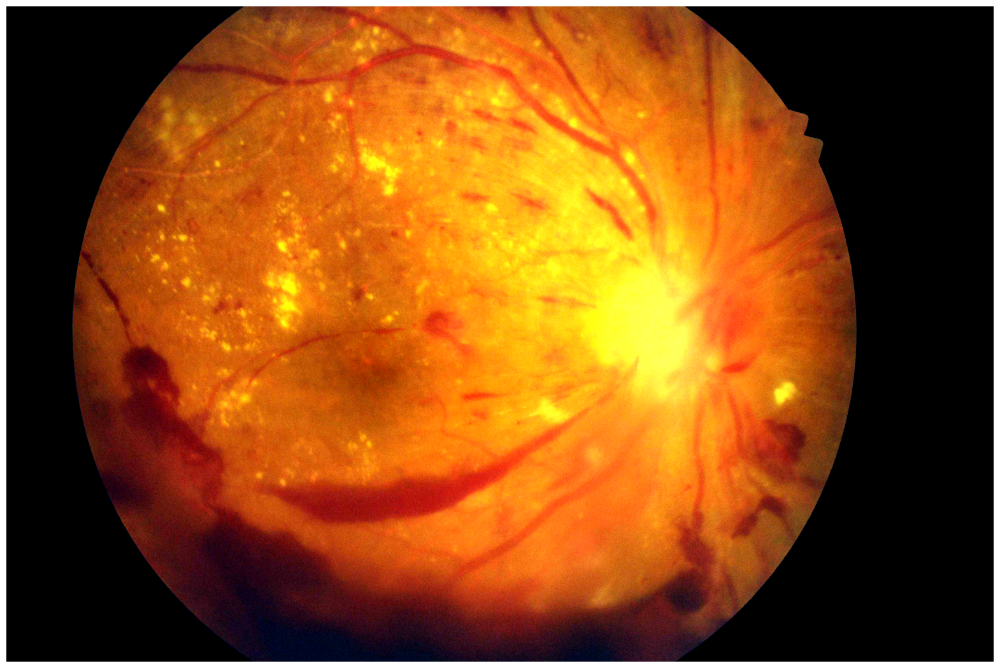

In [6]:
# Testing image data set generation
image = tf.io.read_file(trainingImagePaths[16])
image = tf.io.decode_jpeg(image)
image = tf.squeeze(image)
image.set_shape([None, None, 3])
image = tf.image.adjust_contrast(image, 2.5)
image = tf.cast(image, tf.int32)
plt.figure(figsize=(20, 20))
plt.axis('off')
plt.imshow(image)
plt.show()

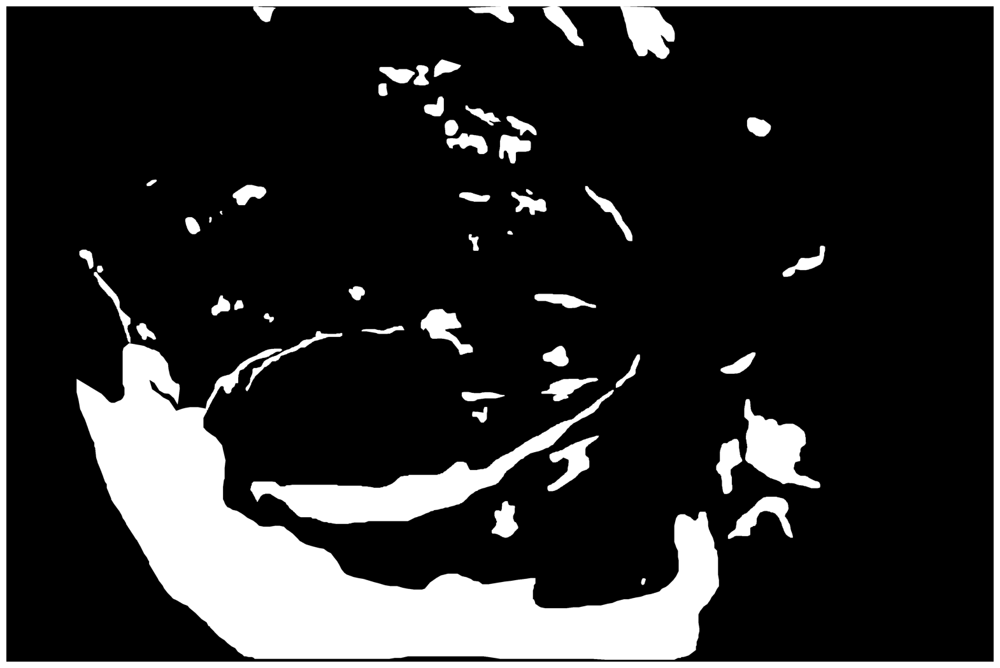

In [20]:
mask = tf.io.read_file(trainingMaskPaths[16])
mask = tfio.experimental.image.decode_tiff(mask)
mask = mask[:, :, :3]
with tf.device('cpu:0'):
    mask = tf.image.rgb_to_grayscale(mask)
mask = tf.divide(mask, 76)
mask.set_shape([None, None, 1])
mask = tf.cast(mask, tf.int32)
plt.figure(figsize=(20, 20))
plt.axis('off')
plt.imshow(mask, cmap='gray')
plt.show()

# Dataset generation and testing

In [5]:
trainDataset = file.datasetGenerator(trainingImagePaths, trainingMaskPaths)
trainDataset

<BatchDataset element_spec=(TensorSpec(shape=(None, 512, 512, 3), dtype=tf.int32, name=None), TensorSpec(shape=(None, 512, 512, 1), dtype=tf.int32, name=None))>

In [ ]:
for img, msk in trainDataset.take(81):
    file.visualize(
                nuotrauka=img[0],
                anotacija=msk[0],
            )

In [ ]:
file.testDataset(trainDataset)

# Model compilation and callbacks

In [9]:
# Model

# Free up RAM in case the model definition cells were run multiple times
tf.keras.backend.clear_session()
sm.set_framework('tf.keras')
BACKBONE   = 'efficientnetb0'
n_classes  = 1 
activation = 'sigmoid' 
model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
linknet_model =  sm.Linknet(BACKBONE, classes=n_classes, activation=activation)

In [10]:
class DisplayCallback(tf.keras.callbacks.Callback):
    def __init__(self, dataset, epoch_interval=5):
        self.dataset = dataset
        self.epoch_interval = epoch_interval
    
    def display(self, display_list, extra_title=''):
        plt.figure(figsize=(15, 15))
        title = ['Input Image', 'True Mask', 'Predicted Mask']

        if len(display_list) > len(title):
            title.append(extra_title)

        for i in range(len(display_list)):
            plt.subplot(1, len(display_list), i+1)
            plt.title(title[i])
            plt.imshow(display_list[i], cmap='gray')
            plt.axis('off')
        plt.show()
        
    def create_mask(self, pred_mask):
        pred_mask = (pred_mask > 0.5).astype("int32")
        return pred_mask[0]
    
    def show_predictions(self, dataset, num=4):
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)
            self.display([image[0], mask[0], self.create_mask(pred_mask)])
        
    def on_epoch_end(self, epoch, logs=None):
        if epoch and epoch % self.epoch_interval == 0:
            self.show_predictions(self.dataset)
            print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

In [44]:
# define optimizer
optimizer = tf.keras.optimizers.Adam(0.0001)
bce   = tf.keras.losses.BinaryCrossentropy()
metrics = ["accuracy"]

# compile keras model with defined optimizer, loss and metrics
model.compile(optimizer, bce, metrics)
linknet_model.compile(optimizer, bce, metrics)

# Loading previous weights

In [54]:
linknet_epochs = "50"
unet_epochs = "50"
unet_checkpoint_path = "./unet-checkpoints/"+ unet_epochs + "-epochs/checkpoint"
linknet_checkpoint_path = "./linknet-checkpoints/" + linknet_epochs + "-epochs/heamorrahage-checkpoint"

In [55]:
model.load_weights(unet_checkpoint_path)
linknet_model.load_weights(linknet_checkpoint_path)

In [51]:
lossU, accU = model.evaluate(trainDataset, verbose=2)
print("U-Net model, accuracy: {:5.2f}%".format(100 * accU))
print("U-Net model, loss: {:5.2f}%".format(100 * lossU))

lossL, accL = linknet_model.evaluate(trainDataset, verbose=2)
print("LinkNet model, accuracy: {:5.2f}%".format(100 * accL))
print("LinkNet model, loss: {:5.2f}%".format(100 * lossL))

2147/2147 - 155s - loss: 0.0582 - accuracy: 0.9924 - 155s/epoch - 72ms/step
U-Net model, accuracy: 99.24%
U-Net model, loss:  5.82%
2147/2147 - 133s - loss: 0.0689 - accuracy: 0.9914 - 133s/epoch - 62ms/step
LinkNet model, accuracy: 99.14%
LinkNet model, loss:  6.89%


In [34]:
model.history.history

{}

# Training link-net model and saving the weights

In [ ]:
linknet_model.fit(
    trainDataset, 
    callbacks=[DisplayCallback(trainDataset)],
    epochs=1
)

In [ ]:
linknet_model.save_weights(linknet_checkpoint_path)

# Training u-net model and saving the weights

In [ ]:
model.fit(
    trainDataset, 
    callbacks=[DisplayCallback(trainDataset)],
    epochs=10
)

In [ ]:
model.save_weights(unet_checkpoint_path)

# Creating validation dataset

In [13]:
TESTING_IMAGE_PATH = 'testing/images'
TESTING_MASK_PATH = 'testing/masks'

In [14]:
testingImagePaths = file.getSortedFilePaths(TESTING_IMAGE_PATH)
testingMaskPaths = file.getSortedFilePaths(TESTING_MASK_PATH)

In [15]:
print("Number of samples:", len(testingImagePaths), len(testingMaskPaths))
for input_path, target_path in zip(testingImagePaths[:10], testingMaskPaths[:10]):
    print(input_path[-31:], "|", target_path[-34:])

Number of samples: 27 27
ata\testing/images\IDRiD_55.jpg | data\testing/masks\IDRiD_55_HE.tif
ata\testing/images\IDRiD_56.jpg | data\testing/masks\IDRiD_56_HE.tif
ata\testing/images\IDRiD_57.jpg | data\testing/masks\IDRiD_57_HE.tif
ata\testing/images\IDRiD_58.jpg | data\testing/masks\IDRiD_58_HE.tif
ata\testing/images\IDRiD_59.jpg | data\testing/masks\IDRiD_59_HE.tif
ata\testing/images\IDRiD_60.jpg | data\testing/masks\IDRiD_60_HE.tif
ata\testing/images\IDRiD_61.jpg | data\testing/masks\IDRiD_61_HE.tif
ata\testing/images\IDRiD_62.jpg | data\testing/masks\IDRiD_62_HE.tif
ata\testing/images\IDRiD_63.jpg | data\testing/masks\IDRiD_63_HE.tif
ata\testing/images\IDRiD_64.jpg | data\testing/masks\IDRiD_64_HE.tif


In [16]:
testDataset = file.datasetGenerator(testingImagePaths, testingMaskPaths)
testDataset

<BatchDataset element_spec=(TensorSpec(shape=(None, 512, 512, 3), dtype=tf.int32, name=None), TensorSpec(shape=(None, 512, 512, 1), dtype=tf.int32, name=None))>

# Model evaluations

In [25]:
loss, acc = model.evaluate(testDataset, verbose=2)
print("Untrained model, accuracy: {:5.2f}%".format(100 * acc))

NameError: name 'model' is not defined

# Model saving

In [ ]:
model.save('./models')

# IoU and Dice

In [56]:
# Test dataset take 10
# Train dataset take 
predicted_masks = [];
true_masks = [];

def displayPrediction(display_list, extra_title=''):
    plt.figure(figsize=(15, 15))
    title = ['Tinklaines nuotrauka', 'Anotacija', 'Segmentuotas vaizdas']

    if len(display_list) > len(title):
        title.append(extra_title)

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(display_list[i], cmap='gray')
        plt.axis('off')
        
    plt.show()
    
def create_mask(pred_mask):
    pred_mask = (pred_mask > 0.5).astype("int32")
    return pred_mask[0]
    
for image, mask in trainDataset.take(4093):
    pred_mask = model.predict(image)
    pred_mask = create_mask(pred_mask)
    if pred_mask.max() != 0:
        true_masks.append(mask[0])
        predicted_masks.append(pred_mask)
        # displayPrediction([image[0], mask[0], pred_mask])


In [58]:
with tf.device("cpu:0"):
    m = tf.keras.metrics.MeanIoU(num_classes=2)
    m.update_state(predicted_masks, true_masks)
    m.result().numpy()

In [59]:
m.result().numpy()

0.5487114

In [64]:
def dice_coef(y_true, y_pred, smooth=100):        
    with tf.device("cpu:0"):
        y_true_f = tf.keras.backend.flatten(y_true)
        y_pred_f = tf.keras.backend.flatten(y_pred)
        intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
        dice = (2 * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)
    return dice

In [65]:
dice_coef(true_masks, predicted_masks)

<tf.Tensor: shape=(), dtype=float64, numpy=0.39825855126105847>

In [66]:
l_predicted_masks = [];
l_true_masks = [];

for image, mask in trainDataset.take(4093):
    pred_mask = linknet_model.predict(image)
    pred_mask = create_mask(pred_mask)
    if pred_mask.max() != 0:
        l_true_masks.append(mask[0])
        l_predicted_masks.append(pred_mask)

In [67]:
with tf.device("cpu:0"):
    l = tf.keras.metrics.MeanIoU(num_classes=2)
    l.update_state(l_predicted_masks, l_true_masks)
    l.result().numpy()

In [69]:
l.result().numpy()

0.55003893

In [68]:
dice_coef(l_true_masks, l_predicted_masks)

<tf.Tensor: shape=(), dtype=float64, numpy=0.3961503076267782>

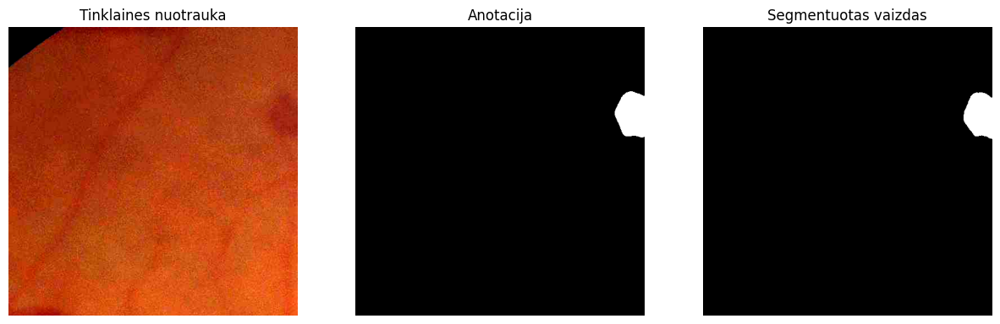

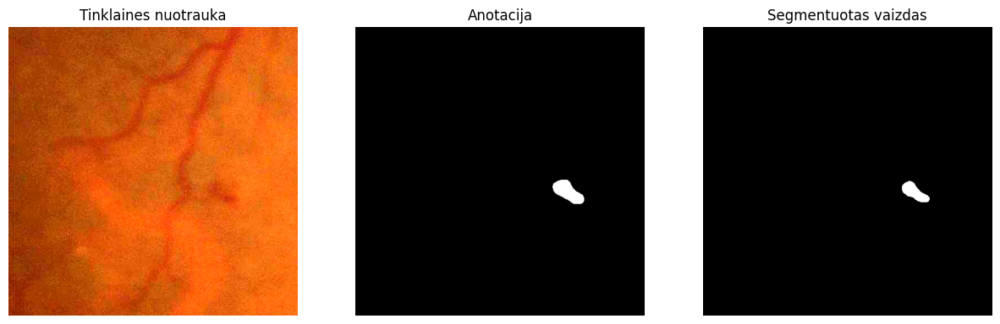

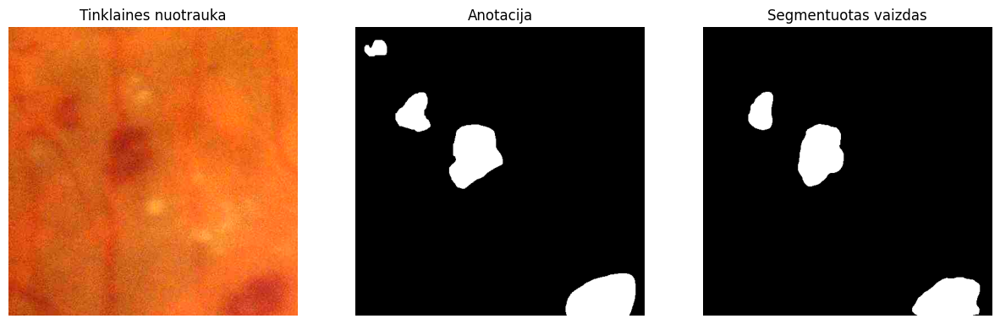

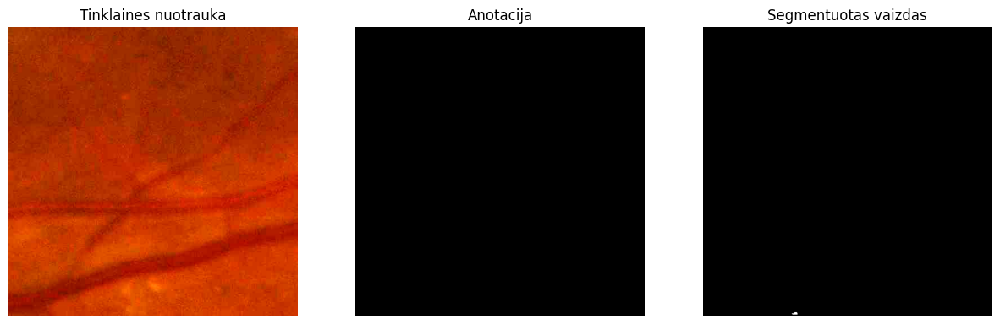

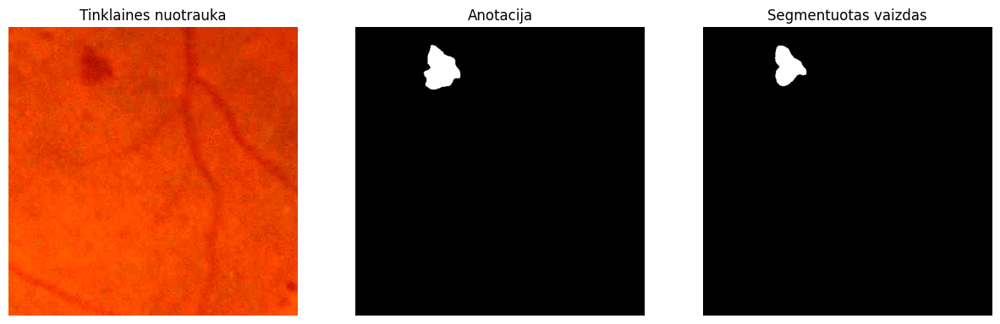

...

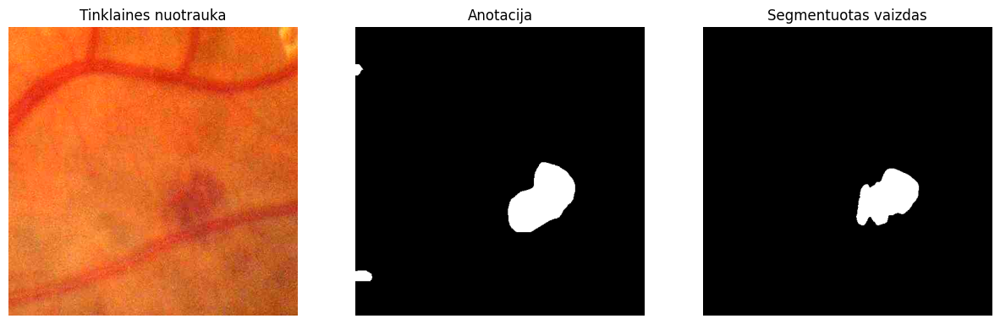

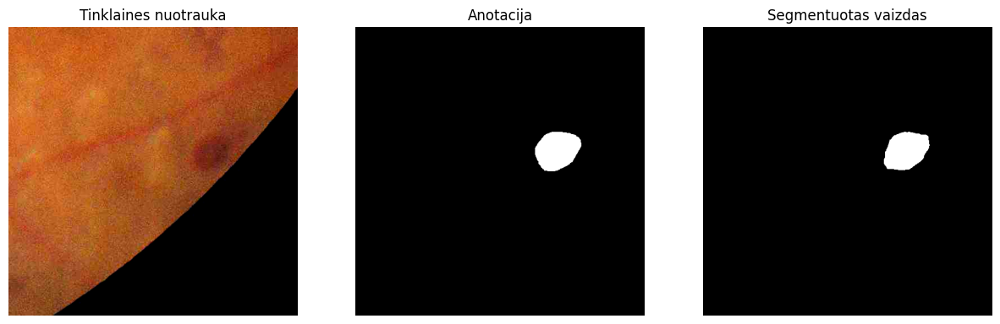

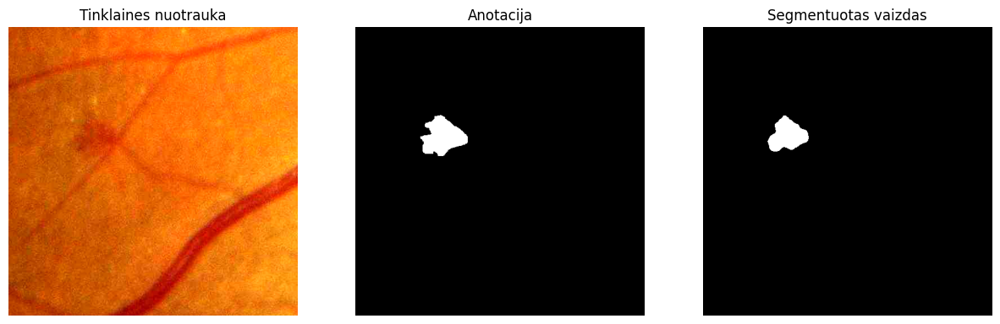

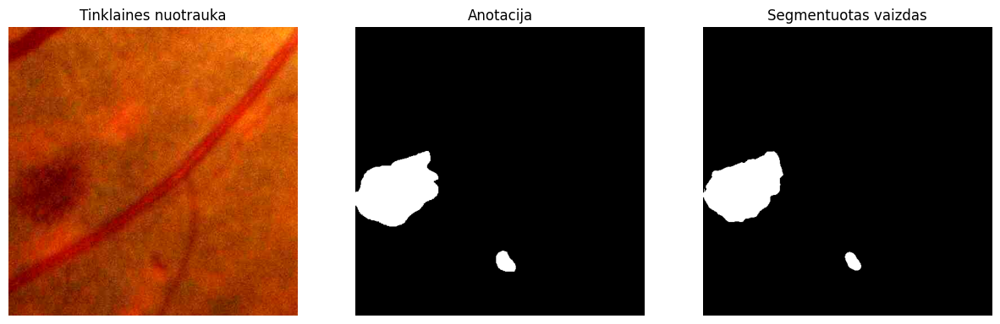

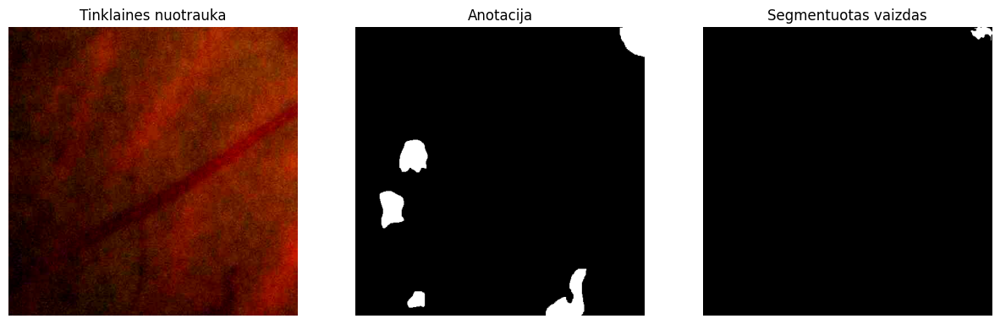

In [70]:
for image, mask in trainDataset.take(162):
    pred_mask = model.predict(image)
    pred_mask = create_mask(pred_mask)
    if pred_mask.max() != 0:
        displayPrediction([image[0], mask[0], pred_mask])

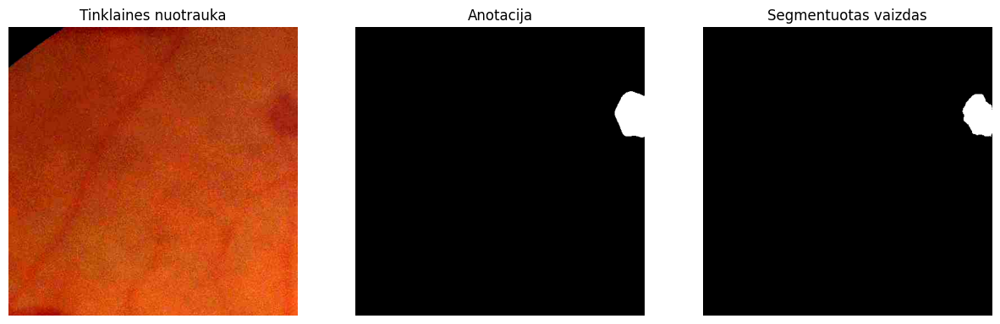

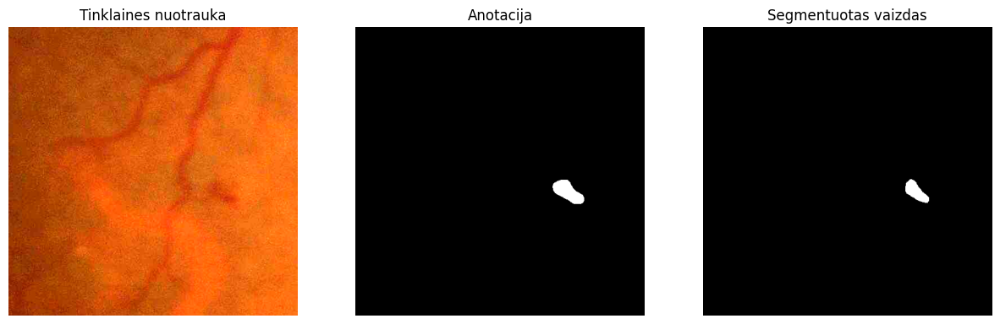

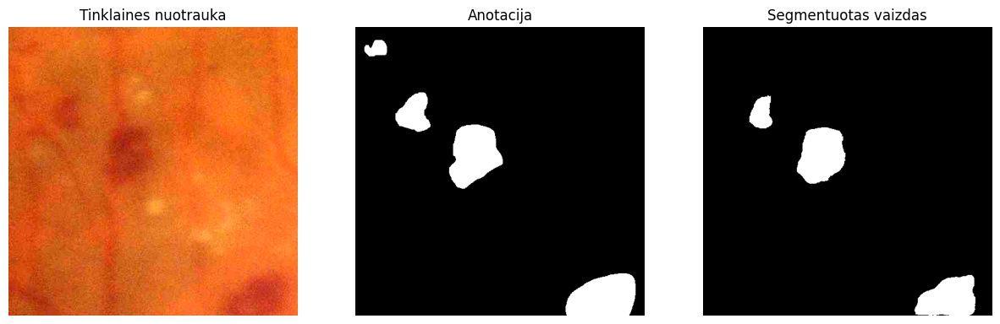

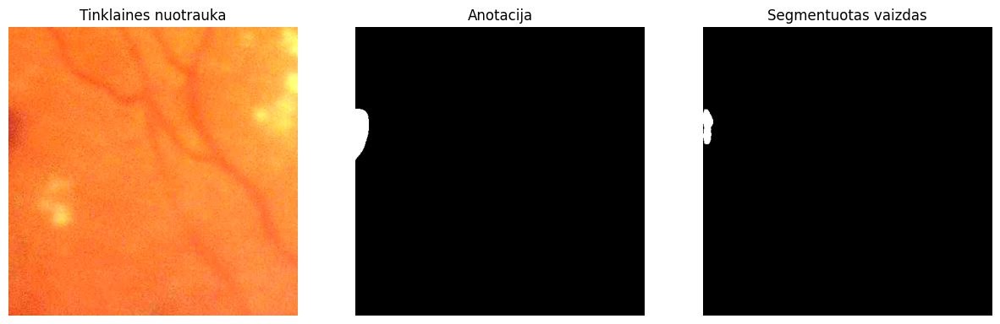

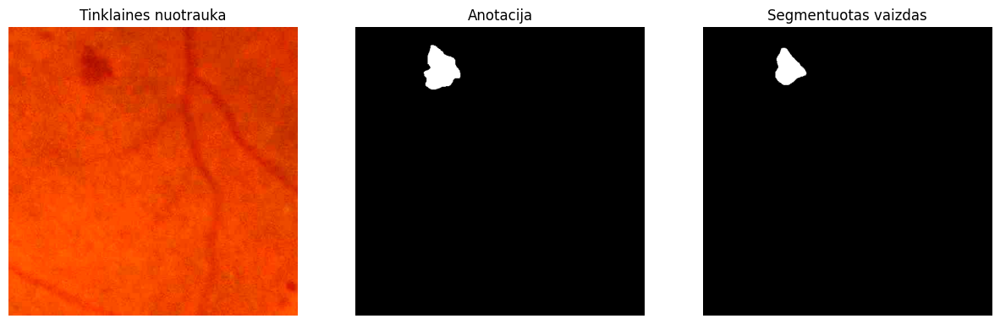

...

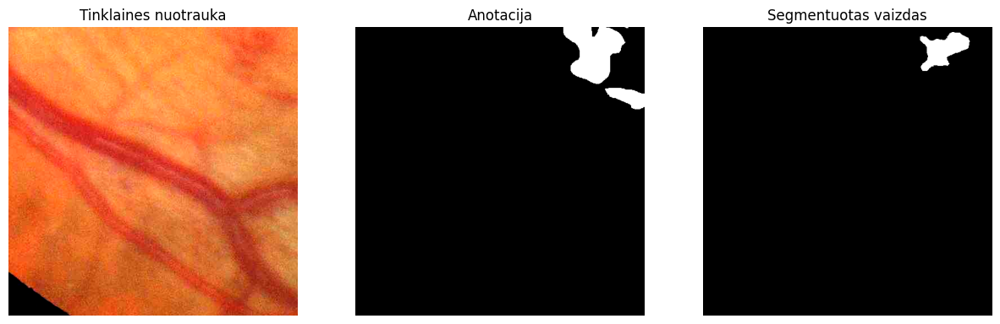

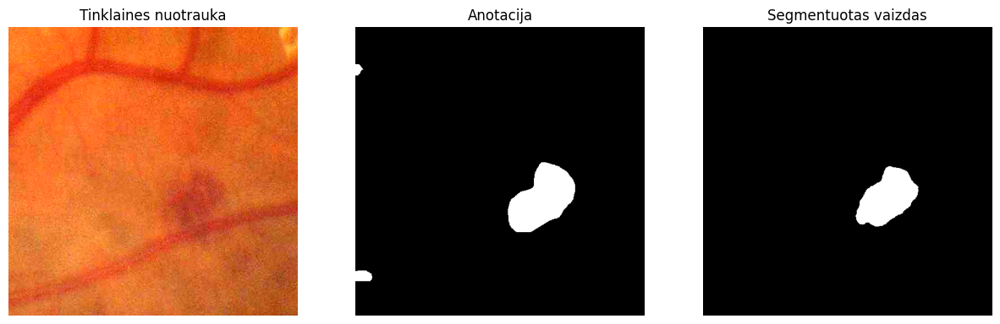

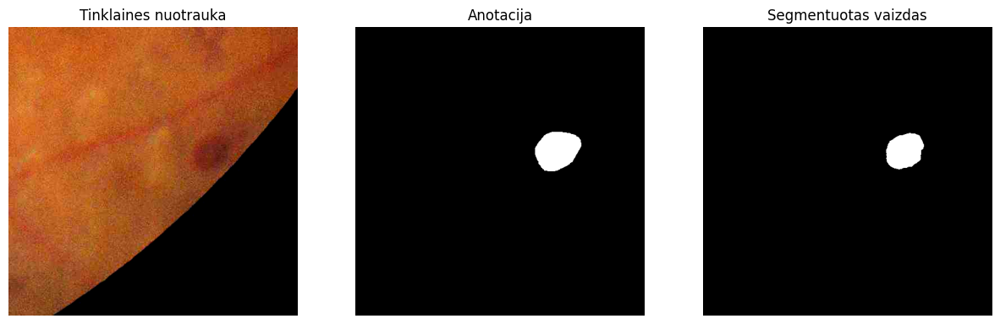

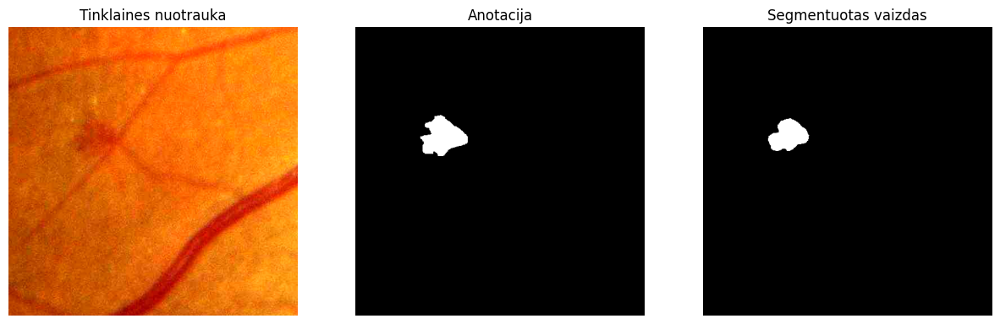

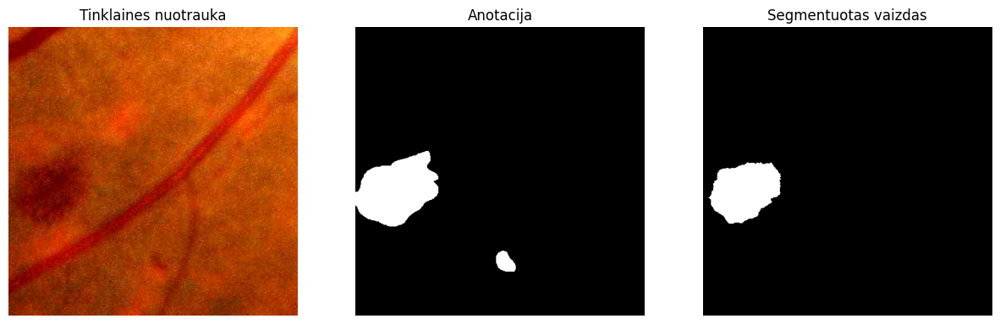

In [71]:
for image, mask in trainDataset.take(162):
    pred_mask = linknet_model.predict(image)
    pred_mask = create_mask(pred_mask)
    if pred_mask.max() != 0:
        displayPrediction([image[0], mask[0], pred_mask])

# This section show the Circle Loss Example

In [7]:
from utils import circle_loss 

sm.set_framework('tf.keras')
BACKBONE   = 'efficientnetb0'
n_classes  = 1 
activation = 'sigmoid' 

# Testing circle loss
unet_circle_loss_model = sm.Unet(BACKBONE, classes=n_classes, activation=activation);
linknet_circle_loss_model = sm.Linknet(BACKBONE, classes=n_classes, activation=activation);

# define optimizer, bce and metrics
circle_loss_optimizer = tf.keras.optimizers.Adam()
circle_loss_bce   = circle_loss.SparseCircleLoss(batch_size=500),
circle_loss_metrics = [tf.keras.metrics.SparseCategoricalAccuracy('acc')]

# compile keras model with defined optimizer, loss and metrics
unet_circle_loss_model.compile(circle_loss_optimizer, circle_loss_bce, circle_loss_metrics)
linknet_circle_loss_model.compile(circle_loss_optimizer, circle_loss_bce, circle_loss_metrics)

In [9]:
circle_loss_linknet_epochs = "5"
circle_loss_unet_epochs = "5"
circle_loss_unet_checkpoint_path = "./circle_loss_cp/unet/"+ circle_loss_unet_epochs + "-epochs/checkpoint"
circle_loss_linknet_checkpoint_path = "./circle_loss_cp/linknet/" + circle_loss_linknet_epochs + "-epochs/checkpoint"

In [31]:
(train_x, train_y) = list(trainDataset.as_numpy_iterator())
train_x

ResourceExhaustedError: Failed to allocate memory for the batch of component 1 [Op:IteratorGetNext]

In [18]:
unet_circle_loss_model.fit(
    trainDataset,
    batch_size=500,
    callbacks=[DisplayCallback(trainDataset)],
    validation_data=testDataset,
    epochs=5
)

Epoch 1/5


ValueError: in user code:

    File "c:\Users\ITWORK\miniconda3\lib\site-packages\keras\engine\training.py", line 1021, in train_function  *
        return step_function(self, iterator)
    File "c:\Projects\haemorrhage-detection-ai\utils\circle_loss.py", line 154, in call  *
        idxs = tf.concat([self.batch_idxs, tf.cast(y_true, tf.int32)], 1)

    ValueError: Shape must be rank 2 but is rank 4 for '{{node SparseCircleLoss/concat}} = ConcatV2[N=2, T=DT_INT32, Tidx=DT_INT32](SparseCircleLoss/concat/values_0, IteratorGetNext:1, SparseCircleLoss/concat/axis)' with input shapes: [500,1], [?,512,512,1], [].
